#### ▶ **Candidate Numbers: 15, 18, 17, 33, 42**

# **Jupyter Notebook 2: Impact of Image Resolution**
---




🌿  We decided that the Jupyter notebook will contain a total of 6 sections, each dedicated to a separate experiment for easier navigation, as outlined below:


| Total number of Notebook: 6                         | Content                                                                                   |
|------------------------------------|-------------------------------------------------------------------------------------------|
|Jupyter Notebook 1: Master U-Net Workflow              | Data preparation, U-Net implementation, training, and evaluation                           |
|**Jupyter Notebook 2:** **Impact of Image Resolution**      | **Experiment with 3 different image resolutions and track performance (64x64, 128x128 and 256x256)**                          |
|Jupyter Notebook 3: Impact of Data Augmentation     | Experiment with data augmentation techniques (3 augmentation with vs. without augmentation)               |
|Jupyter Notebook 4: Impact of Training Data Size    | Experiment with 3 different training data sizes (20%, 50% and 100%)                      |
|Jupyter Notebook 5: Impact of Optimizer             | Experiment with 3 different optimizers (Adam, SGD, RMSprop)                                  |
|Jupyter Notebook 6: Impact of Activation Function   | Experiment with 3 different activation functions (ReLU, Leaky Tanh with Sigmoid)           |




---


### **Resolution Experiment Overview with different image resolutions and track performance**
This experiment examines the impact of using different image resolutions on model performance. The resolutions tested are:

- **64 x 64**
- **128 x 128**
- **256 x 256**


---



# **Install Required Libaries:**

---



In [ ]:
!pip install torch torchvision
!pip install torchsummary
!pip install wandb

In [ ]:
import os
from PIL import Image
import albumentations as A
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import tarfile
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import random
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from albumentations.pytorch import ToTensorV2
import torch
import wandb
from torch.utils.data import Dataset
from albumentations import Compose
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.optim.lr_scheduler as lr_scheduler

# **Check if CUDA device exists, use that. If not default to CPU:**

---



In [ ]:
# If CUDA device exist, use that. If not default to CPU.
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


#🍀 **Wandb Installation**

---



In [ ]:
!pip install wandb
!wandb login
import wandb
!wandb enabled

wandb: Currently logged in as: kandidat18 (kandidat18-kristiania-university-college). Use `wandb login --relogin` to force relogin
W&B enabled.




---


# 🍀**Data Pipeline**


---





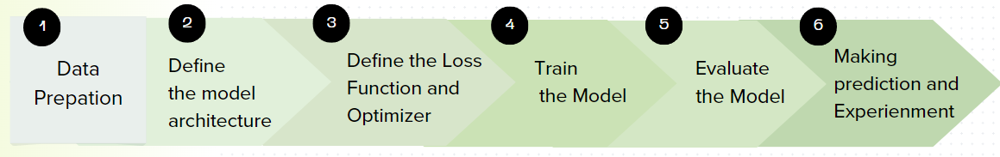



---

# **1. Prepare the Dataset:**

---




## **1.1) Extract images and masks tar.gz files :**




In [ ]:
with tarfile.open('/content/images.tar.gz', 'r:gz') as tar:
    tar.extractall('/content/images')
with tarfile.open('/content/masks.tar.gz', 'r:gz') as tar:
    tar.extractall('/content/masks')


▶ **Get the list of files in each directory and print their counts**

In [ ]:
images_dir = '/content/images/images'
masks_dir = '/content/masks/masks'

images_list = os.listdir(images_dir)
masks_list = os.listdir(masks_dir)

print(f"Number of images: {len(images_list)}")
print(f"Number of masks: {len(masks_list)}")
print(f".............................")
print(f"Images directories contents: {images_list[:10]}")
print(f"Masks directories contents: {masks_list[:10]}")

Number of images: 590
Number of masks: 590
.............................
Images directories contents: ['ckcuhqpeh001k3b5yg9ebvymx.jpg', 'ckcudd247000m3b5yjxgxd6vp.jpg', 'ckd03rjy4001q3b5y7kbvpqhm.jpg', 'ckcuhathy000y3b5yztf7bt9k.jpg', 'ckd04mx29000a3b5yxzr181jz.jpg', 'ckd4jcl8s00123b5yifl4o1dp.jpg', 'ckcx9ub1g00263b5ypitagqy9.jpg', 'ckd498dpe000c3b5y7ma9aibh.jpg', 'ckcud80aw000f3b5yjerqwsbq.jpg', 'ckcvwqk1z001d3b5y3q8bouy2.jpg']
Masks directories contents: ['ckd09bezs000c3b5yy33w0pw6.png', 'ckcua4qo3000w3b5yz2oxtkud.png', 'ckd034o6w000v3b5yq5tp0328.png', 'ckcui0yhw00033b5yqa3jsh9t.png', 'ckd092yf800013b5yhq7orv0b.png', 'ckd4il4jl00093b5y9rlfydho.png', 'ckcx9selb00233b5ya9d409ni.png', 'ckcuau0r900023b5y0s8h6sqf.png', 'ckd4bgbws000k3b5ytvwc86ut.png', 'ckd4h7fq300153b5yhdzs5yar.png']


In [ ]:
import os
import pandas as pd
import cv2

# Define directories for images and masks
images_dir = '/content/images/images'
masks_dir = '/content/masks/masks'

# List image and mask files
image_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir)])
mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir)])

# Create a DataFrame
df = pd.DataFrame({'Image File': image_files, 'Mask File': mask_files})

# Check image and mask sizes for only the first 5 results
for i, (image_path, mask_path) in enumerate(zip(df['Image File'], df['Mask File'])):
    if i >= 5:
        break

    # Load and check image size
    image = cv2.imread(image_path)
    if image is not None:
        image_size = image.shape[:2]  # (height, width)
    else:
        print(f"Warning: Could not load image at path {image_path}")
        image_size = None

    # Load and check mask size
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is not None:
        mask_size = mask.shape  # (height, width)
    else:
        print(f"Warning: Could not load mask at path {mask_path}")
        mask_size = None

    # Print image and mask sizes
    print(f"Image: {image_path}, Size: {image_size} | Mask: {mask_path}, Size: {mask_size}")


Image: /content/images/images/ckcu8ty6z00003b5yzfaezbs5.jpg, Size: (576, 768) | Mask: /content/masks/masks/ckcu8ty6z00003b5yzfaezbs5.png, Size: (576, 768)
Image: /content/images/images/ckcu8v7pr00013b5ymfi2z7uf.jpg, Size: (576, 720) | Mask: /content/masks/masks/ckcu8v7pr00013b5ymfi2z7uf.png, Size: (576, 720)
Image: /content/images/images/ckcu8w7vy00023b5y3vt2wczx.jpg, Size: (576, 720) | Mask: /content/masks/masks/ckcu8w7vy00023b5y3vt2wczx.png, Size: (576, 720)
Image: /content/images/images/ckcu8xad600033b5yc78xfyjx.jpg, Size: (1013, 1225) | Mask: /content/masks/masks/ckcu8xad600033b5yc78xfyjx.png, Size: (1013, 1225)
Image: /content/images/images/ckcu99qx200043b5yd2c5g84t.jpg, Size: (576, 720) | Mask: /content/masks/masks/ckcu99qx200043b5yd2c5g84t.png, Size: (576, 720)


## **1.2) Load train and test file lists :**

---



In [ ]:
with open('/content/train.txt', 'r') as f:
    train_files = f.read().splitlines()
with open('/content/test.txt', 'r') as f:
    test_files = f.read().splitlines()

print(f"Number of training files: {len(train_files)}")
print(f"Number of testing files: {len(test_files)}")
print(f"...........................................")
print(f"Example of testing files: {train_files[:5]}")
print(f"Example of testing files: {test_files[:5]}")

Number of training files: 472
Number of testing files: 118
...........................................
Example of testing files: ['ckcvw5yhd000m3b5yutirmiad', 'ckcvwpanj001b3b5ysxixpcxy', 'ckcuhbkeo000z3b5yq7v1sm0o', 'ckd0afl7u000a3b5y3crqjxla', 'ckcxb6cne000x3b5ynaznq58f']
Example of testing files: ['ckd4ipizn000d3b5yk2vrbyyz', 'ckcxct8oj000k3b5y9iwia72h', 'ckd4ig3d700043b5y0p70afjj', 'ckd03in4g001d3b5yngyc734r', 'ckcx9nmko001u3b5yopeccdvo']


## ▶ **List out sample of images and masks with the different resolutions**


In [ ]:
# Small sample (test)
resolutions = [(64, 64), (128, 128), (256, 256)]

In [ ]:
def load_data(images_dir, masks_dir):
    images_list = sorted(os.listdir(images_dir))
    masks_list = sorted(os.listdir(masks_dir))

    data = {
        'Image File': [os.path.join(images_dir, img) for img in images_list],
        'Mask File': [os.path.join(masks_dir, msk) for msk in masks_list]
    }
    df = pd.DataFrame(data)
    return df
df = load_data(images_dir, masks_dir)
resolutions = [(64, 64), (128, 128), (256, 256)]


Applying resolution: (64, 64) to image: /content/images/images/ckd03mudr001k3b5y173ljv9y.jpg

Applying resolution: (128, 128) to image: /content/images/images/ckd03mudr001k3b5y173ljv9y.jpg

Applying resolution: (256, 256) to image: /content/images/images/ckd03mudr001k3b5y173ljv9y.jpg


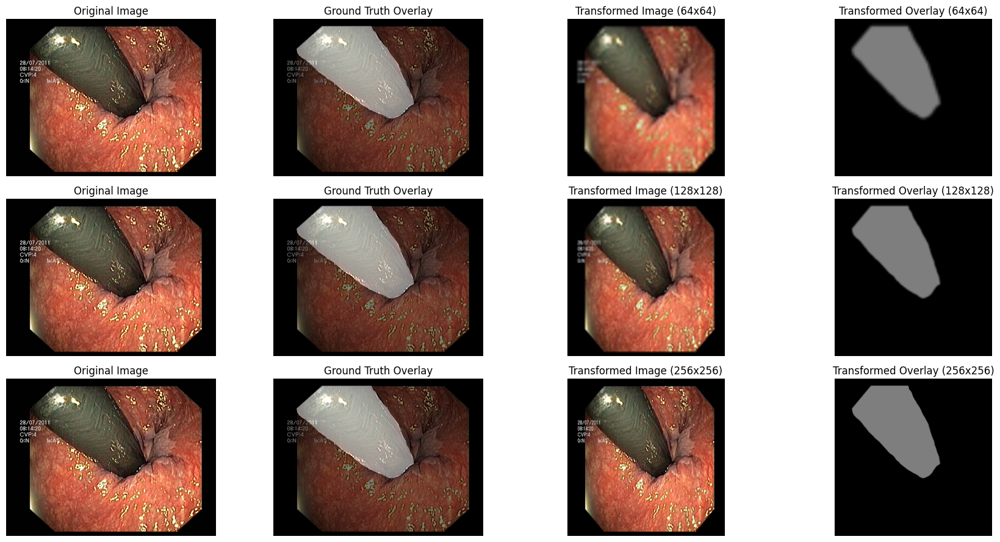

In [ ]:
def get_transforms(resolution):
    # Resize to the initial lower resolution, then resize back up to 256x256
    image_transform = transforms.Compose([
        transforms.Resize(resolution, interpolation=Image.BICUBIC),  # Downscale
        transforms.Resize((256, 256), interpolation=Image.BICUBIC),  # Upscale back to 256x256
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

    mask_transform = transforms.Compose([
        transforms.Resize(resolution),  # Downscale
        transforms.Resize((256, 256)),  # Upscale back to 256x256
        transforms.ToTensor()
    ])

    return image_transform, mask_transform

# Define the display function
def display_random_samples_with_resolutions(df, resolutions):
    fig, ax = plt.subplots(len(resolutions), 4, figsize=(18, len(resolutions) * 3))

    # Select a random sample once to be used across all resolutions
    sample = df.sample(n=1).iloc[0]
    sample_image_path = sample['Image File']
    sample_mask_path = sample['Mask File']

    # Load the original image and mask using PIL
    image = Image.open(sample_image_path).convert("RGB")
    mask = Image.open(sample_mask_path).convert("L")

    for idx, res in enumerate(resolutions):
        print(f"\nApplying resolution: {res} to image: {sample_image_path}")

        # Get transformations for the current resolution
        image_transform, mask_transform = get_transforms(res)

        # Apply transformations
        transformed_image = image_transform(image)
        transformed_mask = mask_transform(mask)

        # Convert tensors to numpy arrays for visualization
        transformed_image_np = transformed_image.permute(1, 2, 0).numpy()
        transformed_image_np = (transformed_image_np * 0.5 + 0.5) * 255  # Undo normalization for display
        transformed_image_np = transformed_image_np.astype(np.uint8)
        transformed_mask_np = transformed_mask.squeeze().numpy() * 255
        transformed_mask_np = transformed_mask_np.astype(np.uint8)

        # Display original image
        ax[idx, 0].imshow(np.array(image))
        ax[idx, 0].set_title("Original Image")
        ax[idx, 0].axis('off')

        # Display original mask overlay on original image
        ax[idx, 1].imshow(np.array(image))
        ax[idx, 1].imshow(np.array(mask), cmap='gray', alpha=0.5)
        ax[idx, 1].set_title("Ground Truth Overlay")
        ax[idx, 1].axis('off')

        # Display transformed image at specified resolution
        ax[idx, 2].imshow(transformed_image_np)
        ax[idx, 2].set_title(f"Transformed Image ({res[0]}x{res[1]})")
        ax[idx, 2].axis('off')

        # Display transformed mask overlay on black background
        ax[idx, 3].imshow(np.zeros_like(transformed_image_np), cmap='gray')
        ax[idx, 3].imshow(transformed_mask_np, cmap='gray', alpha=0.5)
        ax[idx, 3].set_title(f"Transformed Overlay ({res[0]}x{res[1]})")
        ax[idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

display_random_samples_with_resolutions(df, resolutions)


## **1.4) Custom the data :**

---



In [ ]:
# Data set class
class KvasirDataset(Dataset):
    def __init__(self, file_list, img_dir, mask_dir, image_transform=None, mask_transform=None):
        self.file_list = file_list
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img_name = self.file_list[idx]
        img_path = os.path.join(self.img_dir, img_name + '.jpg')
        mask_path = os.path.join(self.mask_dir, img_name + '.png')

        # Load image and mask
        image = cv2.imread(img_path, cv2.IMREAD_COLOR)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Convert image and mask to PIL format
        image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        mask = Image.fromarray(mask)

        # Apply transformations
        if self.image_transform:
            image = self.image_transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)

            if mask.dim() == 2:  # If mask has shape [H, W]
                mask = mask.unsqueeze(0)
            elif mask.dim() == 3 and mask.size(0) > 1:  # If mask has an extra channel
                mask = mask[0].unsqueeze(0)

        return image, mask


##  **1.5) Build training and testing datasets - Create DataLoaders for training and testing :**

In [ ]:
# Loop over each resolution for processing
for res in resolutions:
    print(f"\nStarting experiment with resolution: {res}")

    image_transform, mask_transform = get_transforms(res)

    # Initialize the datasets with the current resolution's transforms
    train_dataset = KvasirDataset(train_files, images_dir, masks_dir,
                                  image_transform=image_transform,
                                  mask_transform=mask_transform)
    test_dataset = KvasirDataset(test_files, images_dir, masks_dir,
                                 image_transform=image_transform,
                                 mask_transform=mask_transform)

    # Create DataLoaders for training and testing
    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4, drop_last=True)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=4, drop_last=False)

    # Verify batch size, original image size, and resized image dimensions
    for images, masks in train_loader:
        print(f"Batch size: {images.size(0)}")
        print(f"Image dimensions (after resizing): {images.size()}")
        print(f"Mask dimensions (after resizing): {masks.size()}")
        break

    print("Verification complete for this resolution.")



Starting experiment with resolution: (64, 64)
Batch size: 8
Image dimensions (after resizing): torch.Size([8, 3, 256, 256])
Mask dimensions (after resizing): torch.Size([8, 1, 256, 256])
Verification complete for this resolution.

Starting experiment with resolution: (128, 128)
Batch size: 8
Image dimensions (after resizing): torch.Size([8, 3, 256, 256])
Mask dimensions (after resizing): torch.Size([8, 1, 256, 256])
Verification complete for this resolution.

Starting experiment with resolution: (256, 256)
Batch size: 8
Image dimensions (after resizing): torch.Size([8, 3, 256, 256])
Mask dimensions (after resizing): torch.Size([8, 1, 256, 256])
Verification complete for this resolution.


▶ We can see that the experiements confrim correct size and resized image and masks dimensions for each resolution tested ((64x64, 128x128, 256x256), with confrim complete at each stage.

▶  **Fetch a random batch from train_loader**


Starting with resolution: (64, 64)


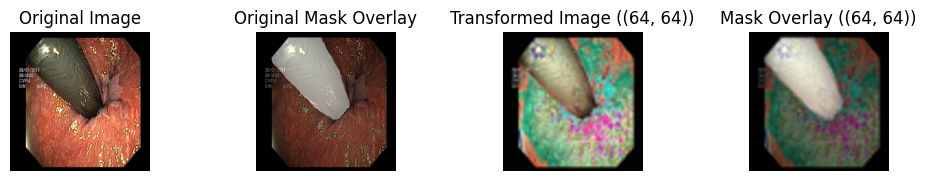


Starting with resolution: (128, 128)


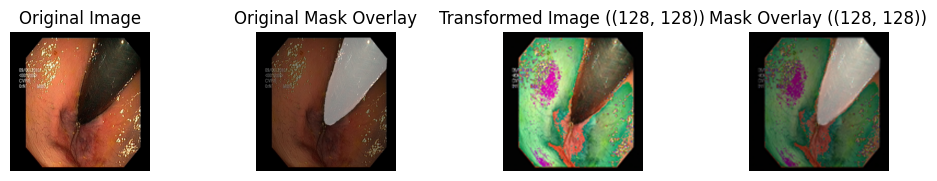


Starting with resolution: (256, 256)


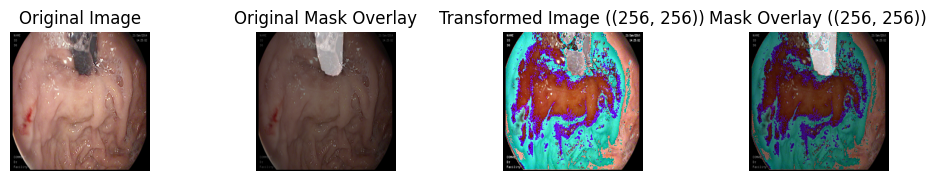

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

# Loop over each resolution
for res in resolutions:
    print(f"\nStarting with resolution: {res}")

    # Get the transformations for the current resolution
    image_transform, mask_transform = get_transforms(res)

    def images_after_processed(images, masks):
        plt.figure(figsize=(10, 5))

        for i in range(1):
            # Original Image
            plt.subplot(3, 4, i * 4 + 1)
            img_np = images[i].permute(1, 2, 0).numpy()
            img_np = (img_np * 0.5 + 0.5) * 255
            img_np = img_np.astype(np.uint8)
            plt.imshow(img_np)
            plt.axis('off')
            plt.title('Original Image')

            # Ground Truth Mask Overlay on Original Image
            plt.subplot(3, 4, i * 4 + 2)
            plt.imshow(img_np)
            mask_np = masks[i].squeeze().numpy() * 255
            mask_np = mask_np.astype(np.uint8)
            plt.imshow(mask_np, cmap='gray', alpha=0.5)
            plt.axis('off')
            plt.title('Original Mask Overlay')

            # Apply transformations to image and mask for the specified resolution
            transformed_image = image_transform(TF.to_pil_image(images[i].cpu()))
            transformed_mask = mask_transform(TF.to_pil_image(masks[i].squeeze().cpu()))

            # Convert tensors to numpy arrays for plotting
            transformed_image_np = transformed_image.permute(1, 2, 0).numpy()
            transformed_image_np = (transformed_image_np * 0.5 + 0.5) * 255  # Undo normalization for display
            transformed_image_np = transformed_image_np.astype(np.uint8)
            transformed_mask_np = transformed_mask.squeeze().numpy() * 255
            transformed_mask_np = transformed_mask_np.astype(np.uint8)

            # Transformed Image at specified resolution
            plt.subplot(3, 4, i * 4 + 3)
            plt.imshow(transformed_image_np)
            plt.axis('off')
            plt.title(f'Transformed Image ({res})')

            # Transformed Image with Mask Overlay at specified resolution
            plt.subplot(3, 4, i * 4 + 4)
            plt.imshow(transformed_image_np)
            plt.imshow(transformed_mask_np, cmap='gray', alpha=0.5)  # Overlay transformed mask
            plt.axis('off')
            plt.title(f'Mask Overlay ({res})')

        plt.tight_layout()
        plt.show()

    # Fetch a random batch from train_loader
    for images, masks in train_loader:
        images_after_processed(images, masks)
        break



---


# **2. Define the model architecture**


---



In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Encoder part (contracting path)
        self.enc1 = self.conv_block(3, 64, p=0.3)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = self.conv_block(64, 128, p=0.3)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = self.conv_block(128, 256, p=0.3)
        self.pool3 = nn.MaxPool2d(2)

        self.enc4 = self.conv_block(256, 512, p=0.3)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck (bottom of the U)
        self.bottleneck = self.conv_block(512, 1024, p=0.3)

        # Decoder part (expanding path)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512, p=0.3)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256, p=0.3)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128, p=0.3)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64, p=0.3)

        # Final output layer
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def conv_block(self, in_channels, out_channels, p=0.3):
        """Convolutional block with dropout."""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(p),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(), # Relu activation function
            nn.Dropout(p)
        )

    def forward(self, x):
        # Encoder
        x1 = self.enc1(x)
        p1 = self.pool1(x1)

        x2 = self.enc2(p1)
        p2 = self.pool2(x2)

        x3 = self.enc3(p2)
        p3 = self.pool3(x3)

        x4 = self.enc4(p3)
        p4 = self.pool4(x4)

        # Bottleneck
        b = self.bottleneck(p4)

        # Decoder with skip connections
        u4 = self.upconv4(b)
        d4 = torch.cat([u4, x4], dim=1)
        d4 = self.dec4(d4)

        u3 = self.upconv3(d4)
        d3 = torch.cat([u3, x3], dim=1)
        d3 = self.dec3(d3)

        u2 = self.upconv2(d3)
        d2 = torch.cat([u2, x2], dim=1)
        d2 = self.dec2(d2)

        u1 = self.upconv1(d2)
        d1 = torch.cat([u1, x1], dim=1)
        d1 = self.dec1(d1)

        # Final output layer
        out = self.final(d1)
        return torch.sigmoid(out)  # Sigmoid for binary segmentation must remains the same




---


# **3. Define the loss function and optimizer**

---



In [ ]:
# Reinitialize the model and optimizer
import torch.optim.lr_scheduler as lr_scheduler
from torchsummary import summary

model = UNet()
criterion = nn.BCELoss()

optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
images, masks = images.to(device), masks.to(device)
print(device)
summary(model, input_size=(3, 256, 256)) # input size

cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
           Dropout-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
              ReLU-5         [-1, 64, 256, 256]               0
           Dropout-6         [-1, 64, 256, 256]               0
         MaxPool2d-7         [-1, 64, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
              ReLU-9        [-1, 128, 128, 128]               0
          Dropout-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
             ReLU-12        [-1, 128, 128, 128]               0
          Dropout-13        [-1, 128, 128, 128]               0
        MaxPool2d-14          [-1,



---


# **4. Train the model**

---






### ▶ **Calculate Evaluation metrics**

In [ ]:
def calculate_metrics_function(true_mask, predicted_masks, smooth=1e-6):
    true_mask = true_mask.to(predicted_masks.device)
    true_masks_flat = true_mask.view(-1).cpu().numpy()
    predicted_masks_flat = predicted_masks.view(-1).cpu().numpy()

    # True Positives, False Positives, False Negatives
    TruePositive = np.sum((true_masks_flat == 1) & (predicted_masks_flat == 1))
    FalsePositive = np.sum((true_masks_flat == 0) & (predicted_masks_flat == 1))
    FalseNegative = np.sum((true_masks_flat == 1) & (predicted_masks_flat == 0))

    # Accuracy
    total_pixels = true_masks_flat.size
    accuracy = (TruePositive + (total_pixels - TruePositive - FalsePositive - FalseNegative)) / total_pixels

    # Precision, Recall, F1-score, DSC
    precision_score = TruePositive / (TruePositive + FalsePositive) if (TruePositive + FalsePositive) > 0 else 0
    recall_score = TruePositive / (TruePositive + FalseNegative) if (TruePositive + FalseNegative) > 0 else 0
    f1_score = 2 * (precision_score * recall_score) / (precision_score + recall_score) if (precision_score + recall_score) > 0 else 0
    dcs_score = (2 * TruePositive + smooth) / (2 * TruePositive + FalsePositive + FalseNegative + smooth)

    # IoU (Intersection over Union)
    union = TruePositive + FalsePositive + FalseNegative
    iou = (TruePositive + smooth) / (union + smooth)

    return accuracy * 100, precision_score, recall_score, f1_score, dcs_score, iou



### ▶ **Training Setup**

In [ ]:
def train_model(model, train_loader, criterion, optimizer, device):
  model.train()
  train_loss = 0.0
  correct_pixels = 0
  total_pixels = 0
  total_dsc = 0
  total_iou = 0

  for images, masks in train_loader:
      images, masks = images.to(device), masks.to(device)
      optimizer.zero_grad()

      outputs = model(images)
      loss = criterion(outputs, masks)
      train_loss += loss.item()

      predicted_masks = (torch.sigmoid(outputs) > 0.5).float()


      # calculate training accuracy
      predicted_masks = (outputs > 0.5).float()
      correct_pixels += (predicted_masks == masks).float().sum().item()
      total_pixels += masks.numel()

      # Calculate Dice Coe
      _,_,_,_,dsc, iou = calculate_metrics_function(masks, predicted_masks)
      total_dsc += dsc
      total_iou += iou

      loss.backward()
      optimizer.step()

  avg_train_loss = train_loss / len(train_loader)
  train_accuracy = 100 * correct_pixels / total_pixels
  avg_dsc = total_dsc / len(train_loader)
  avg_iou = total_iou / len(train_loader)

  return avg_train_loss, train_accuracy, avg_dsc, avg_iou



---


# **5. Test the model**

---






In [ ]:
def test_model(model, test_loader, criterion, device):
  model.eval()
  test_loss = 0
  all_true_masks = []
  all_predicted_masks = []

  with torch.no_grad():
    for images, masks in test_loader:

      images, masks = images.to(device), masks.to(device)

      # Forward pass function
      outputs = model(images)
      loss = criterion(outputs, masks)
      test_loss += loss.item()

      # Save true and predicted masks
      all_true_masks.append(masks)
      all_predicted_masks.append((outputs > 0.5).float())

  # Conclude all the results across batches
  all_true_masks = torch.cat(all_true_masks)
  all_predicted_masks = torch.cat(all_predicted_masks)

  # Calculate metrics
  accuracy, precision_score, recall_score, f1_score, dcs_score, iou = calculate_metrics_function(all_true_masks, all_predicted_masks)
  avg_test_loss = test_loss / len(test_loader)

  return avg_test_loss, accuracy, precision_score, recall_score, f1_score, dcs_score, iou



---


# **6. Making the prediction and experiment**



---




 ▶ **Print metrics for the current epoch** : **30 with early stooping in patience of 5**




---


## 🌱 **64 x 64 resolution**

---



In [ ]:
import wandb
resolution = (64, 64)
epochs_number = 30
patience = 5

# Initialize WandB
wandb.init(project="final_resolution", entity="kandidat18-kristiania-university-college", config={
    "optimizer": "ADAM",
    "epochs": epochs_number,
    "resolution": resolution
})

print(f"\nStarting experiment with resolution: {resolution}")
image_transform, mask_transform = get_transforms(resolution)

# Initialize the datasets with the current resolution's transforms
train_dataset = KvasirDataset(train_files, images_dir, masks_dir,
                              image_transform=image_transform,
                              mask_transform=mask_transform)
test_dataset = KvasirDataset(test_files, images_dir, masks_dir,
                             image_transform=image_transform,
                             mask_transform=mask_transform)

# Create DataLoaders for training and testing
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, drop_last=False)

# Reinitialize the model, criterion, optimizer, and scheduler
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

# Initialize early stopping and metric tracking variables
best_test_dsc = 0
epochs_no_improve = 0
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
train_dsc_values, test_dsc_values = [], []
train_iou_values, test_iou_values = [], []

# Training loop for the specified resolution
for epoch in range(epochs_number):
    print(f"Epoch [{epoch + 1}/{epochs_number}]")

    # Training step
    train_loss, train_accuracy, train_dsc, train_iou = train_model(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    train_dsc_values.append(train_dsc)
    train_iou_values.append(train_iou)

    # Testing step
    test_loss, test_accuracy, precision_score, recall_score, f1_score, test_dsc, test_iou = test_model(model, test_loader, criterion, device)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    test_dsc_values.append(test_dsc)
    test_iou_values.append(test_iou)

    # Log metrics to WandB
    try:
        wandb.log({
            "Epoch": epoch + 1,
            "Train Loss": train_loss,
            "Train Accuracy": train_accuracy,
            "Train DSC": train_dsc,
            "Train IoU": train_iou,
            "Test Loss": test_loss,
            "Test Accuracy": test_accuracy,
            "Test Precision": precision_score,
            "Test Recall": recall_score,
            "Test F1-Score": f1_score,
            "Test DSC": test_dsc,
            "Test IoU": test_iou
        })
    except Exception as e:
        print(f"WandB logging error: {e}")

    print(f"Resolution: {resolution}, Epoch [{epoch + 1}/{epochs_number}]")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Train DSC: {train_dsc:.4f}, Train IoU: {train_iou:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%, "
          f"Test Precision: {precision_score:.4f}, Test Recall: {recall_score:.4f}, "
          f"Test F1-Score: {f1_score:.4f}, Test DSC: {test_dsc:.4f}, Test IoU: {test_iou:.4f}\n")

    # Step the scheduler
    scheduler.step()

    # Early stopping check
    if test_dsc > best_test_dsc:
        best_test_dsc = test_dsc
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Epoch {epoch + 1}: Test DSC = {test_dsc:.4f}, Best DSC = {best_test_dsc:.4f}, No Improvement Count = {epochs_no_improve}")

    if epochs_no_improve >= patience:
        print("Early stopping triggered!")
        break

wandb.finish()


Epoch,▁▂▂▃▄▅▅▆▇▇█
Test Accuracy,▁▇▅▇██▇████
Test DSC,▁█▇████████
Test F1-Score,▁█▇████████
Test IoU,▁█▇████████
Test Loss,██▆▂▃▂▃▁▁▁▁
Test Precision,▁█▇███▇████
Test Recall,▁▇▇█▇██████
Train Accuracy,▁▂▆▇▇▇█████
Train DSC,▁▂▇▇███████
Train IoU,▁▂▇▇▇▇▇████



Starting experiment with resolution: (64, 64)
Epoch [1/30]
Resolution: (64, 64), Epoch [1/30]
Train Loss: 0.3730, Train Accuracy: 83.61%, Train DSC: 0.0053, Train IoU: 0.0028
Test Loss: 0.2045, Test Accuracy: 93.62%, Test Precision: 1.0000, Test Recall: 0.0005, Test F1-Score: 0.0010, Test DSC: 0.0010, Test IoU: 0.0005

Epoch 1: Test DSC = 0.0010, Best DSC = 0.0010, No Improvement Count = 0
Epoch [2/30]
Resolution: (64, 64), Epoch [2/30]
Train Loss: 0.2215, Train Accuracy: 87.72%, Train DSC: 0.3264, Train IoU: 0.2175
Test Loss: 0.1855, Test Accuracy: 94.72%, Test Precision: 0.9622, Test Recall: 0.1791, Test F1-Score: 0.3020, Test DSC: 0.3020, Test IoU: 0.1779

Epoch 2: Test DSC = 0.3020, Best DSC = 0.3020, No Improvement Count = 0
Epoch [3/30]
Resolution: (64, 64), Epoch [3/30]
Train Loss: 0.2054, Train Accuracy: 88.32%, Train DSC: 0.4593, Train IoU: 0.3180
Test Loss: 0.1622, Test Accuracy: 96.60%, Test Precision: 0.8358, Test Recall: 0.5811, Test F1-Score: 0.6856, Test DSC: 0.6856, Te

Epoch,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
Test Accuracy,▁▃▅▆▆▆▆▇▆▆▆▇▆▇▇▇▇▇▇█▄▆▆▆▆
Test DSC,▁▃▆▇▇▇▇█▇▇▇█▇██▇████▅▇▇▇▇
Test F1-Score,▁▃▆▇▇▇▇█▇▇▇█▇██▇████▅▇▇▇▇
Test IoU,▁▃▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇██▄▆▆▇▇
Test Loss,█▇▅▅▄▄▃▃▃▃▃▃▃▂▃▂▃▃▁▂▆▄▄▄▄
Test Precision,█▇▃▄▅▃▁▂▁▁▁▂▁▂▂▅▂▆▃▄▆▁▄▃▂
Test Recall,▁▂▆▆▆▇█████████▇█▇██▄▇▆▇▇
Train Accuracy,▁▅▆▇▇▇▇█████████████▄▆▇▇▇
Train DSC,▁▄▅▇▇▇▇█████████████▅▆▇▇▇
Train IoU,▁▃▄▆▆▆▇▇████████████▅▅▇▇▇




---


## 🌱 **128 x 128 resolution**

---



In [ ]:
import wandb
resolution = (128, 128)
epochs_number = 30
patience = 5

# Initialize WandB
wandb.init(project="final_resolution", entity="kandidat18-kristiania-university-college", config={
    "optimizer": "ADAM",
    "epochs": epochs_number,
    "resolution": resolution
})

print(f"\nStarting experiment with resolution: {resolution}")
image_transform, mask_transform = get_transforms(resolution)

# Initialize the datasets with the current resolution's transforms
train_dataset = KvasirDataset(train_files, images_dir, masks_dir,
                              image_transform=image_transform,
                              mask_transform=mask_transform)
test_dataset = KvasirDataset(test_files, images_dir, masks_dir,
                             image_transform=image_transform,
                             mask_transform=mask_transform)

# Create DataLoaders for training and testing
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, drop_last=False)

# Reinitialize the model, criterion, optimizer, and scheduler
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

# Initialize early stopping and metric tracking variables
best_test_dsc = 0
epochs_no_improve = 0
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
train_dsc_values, test_dsc_values = [], []
train_iou_values, test_iou_values = [], []

# Training loop for the specified resolution
for epoch in range(epochs_number):
    print(f"Epoch [{epoch + 1}/{epochs_number}]")

    # Training step
    train_loss, train_accuracy, train_dsc, train_iou = train_model(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    train_dsc_values.append(train_dsc)
    train_iou_values.append(train_iou)

    # Testing step
    test_loss, test_accuracy, precision_score, recall_score, f1_score, test_dsc, test_iou = test_model(model, test_loader, criterion, device)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    test_dsc_values.append(test_dsc)
    test_iou_values.append(test_iou)

    # Log metrics to WandB
    try:
        wandb.log({
            "Epoch": epoch + 1,
            "Train Loss": train_loss,
            "Train Accuracy": train_accuracy,
            "Train DSC": train_dsc,
            "Train IoU": train_iou,
            "Test Loss": test_loss,
            "Test Accuracy": test_accuracy,
            "Test Precision": precision_score,
            "Test Recall": recall_score,
            "Test F1-Score": f1_score,
            "Test DSC": test_dsc,
            "Test IoU": test_iou
        })
    except Exception as e:
        print(f"WandB logging error: {e}")

    print(f"Resolution: {resolution}, Epoch [{epoch + 1}/{epochs_number}]")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Train DSC: {train_dsc:.4f}, Train IoU: {train_iou:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%, "
          f"Test Precision: {precision_score:.4f}, Test Recall: {recall_score:.4f}, "
          f"Test F1-Score: {f1_score:.4f}, Test DSC: {test_dsc:.4f}, Test IoU: {test_iou:.4f}\n")

    # Step the scheduler
    scheduler.step()

    # Early stopping check
    if test_dsc > best_test_dsc:
        best_test_dsc = test_dsc
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Epoch {epoch + 1}: Test DSC = {test_dsc:.4f}, Best DSC = {best_test_dsc:.4f}, No Improvement Count = {epochs_no_improve}")

    if epochs_no_improve >= patience:
        print("Early stopping triggered!")
        break

wandb.finish()



Starting experiment with resolution: (128, 128)
Epoch [1/30]
Resolution: (128, 128), Epoch [1/30]
Train Loss: 0.3083, Train Accuracy: 85.52%, Train DSC: 0.0123, Train IoU: 0.0066
Test Loss: 0.1927, Test Accuracy: 92.39%, Test Precision: 0.9368, Test Recall: 0.0238, Test F1-Score: 0.0463, Test DSC: 0.0463, Test IoU: 0.0237

Epoch 1: Test DSC = 0.0463, Best DSC = 0.0463, No Improvement Count = 0
Epoch [2/30]
Resolution: (128, 128), Epoch [2/30]
Train Loss: 0.2119, Train Accuracy: 89.67%, Train DSC: 0.3422, Train IoU: 0.2224
Test Loss: 0.1602, Test Accuracy: 95.89%, Test Precision: 0.8429, Test Recall: 0.5789, Test F1-Score: 0.6864, Test DSC: 0.6864, Test IoU: 0.5225

Epoch 2: Test DSC = 0.6864, Best DSC = 0.6864, No Improvement Count = 0
Epoch [3/30]
Resolution: (128, 128), Epoch [3/30]
Train Loss: 0.1832, Train Accuracy: 91.14%, Train DSC: 0.6025, Train IoU: 0.4467
Test Loss: 0.1469, Test Accuracy: 95.93%, Test Precision: 0.8260, Test Recall: 0.6037, Test F1-Score: 0.6976, Test DSC: 0.

Epoch,▁▂▂▃▄▄▅▅▆▇▇█
Test Accuracy,▁▇▇▇█▆█▆▆▆▆▆
Test DSC,▁▇▇▇▇███████
Test F1-Score,▁▇▇▇▇███████
Test IoU,▁▆▇▇▇██▇▇███
Test Loss,█▅▄▅▁▃▁▃▃▃▂▂
Test Precision,█▆▅▆▆▂▄▁▁▁▁▂
Test Recall,▁▅▅▆▆█▇█████
Train Accuracy,▁▅▇▇▇███████
Train DSC,▁▄▇▇▇███████
Train IoU,▁▄▆▇▆▇██████




---


## 🌱 **256 x 256 resolution**

---



In [ ]:
import wandb
resolution = (256, 256)
epochs_number = 30
patience = 5

wandb.init(project="final_resolution", entity="kandidat18-kristiania-university-college", config={
    "optimizer": "ADAM",
    "epochs": epochs_number,
    "resolution": resolution
})


print(f"\nStarting experiment with resolution: {resolution}")
image_transform, mask_transform = get_transforms(resolution)

# Initialize the datasets with the current resolution's transforms
train_dataset = KvasirDataset(train_files, images_dir, masks_dir,
                              image_transform=image_transform,
                              mask_transform=mask_transform)
test_dataset = KvasirDataset(test_files, images_dir, masks_dir,
                             image_transform=image_transform,
                             mask_transform=mask_transform)

# Create DataLoaders for training and testing
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2, drop_last=False)

# Reinitialize the model, criterion, optimizer, and scheduler
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

# Initialize early stopping and metric tracking variables
best_test_dsc = 0
epochs_no_improve = 0
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
train_dsc_values, test_dsc_values = [], []
train_iou_values, test_iou_values = [], []

# Training loop for the specified resolution
for epoch in range(epochs_number):
    print(f"Epoch [{epoch + 1}/{epochs_number}]")

    # Training step
    train_loss, train_accuracy, train_dsc, train_iou = train_model(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    train_dsc_values.append(train_dsc)
    train_iou_values.append(train_iou)

    # Testing step
    test_loss, test_accuracy, precision_score, recall_score, f1_score, test_dsc, test_iou = test_model(model, test_loader, criterion, device)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    test_dsc_values.append(test_dsc)
    test_iou_values.append(test_iou)

    # Log metrics to WandB
    try:
        wandb.log({
            "Epoch": epoch + 1,
            "Train Loss": train_loss,
            "Train Accuracy": train_accuracy,
            "Train DSC": train_dsc,
            "Train IoU": train_iou,
            "Test Loss": test_loss,
            "Test Accuracy": test_accuracy,
            "Test Precision": precision_score,
            "Test Recall": recall_score,
            "Test F1-Score": f1_score,
            "Test DSC": test_dsc,
            "Test IoU": test_iou
        })
    except Exception as e:
        print(f"WandB logging error: {e}")

    print(f"Resolution: {resolution}, Epoch [{epoch + 1}/{epochs_number}]")
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Train DSC: {train_dsc:.4f}, Train IoU: {train_iou:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%, "
          f"Test Precision: {precision_score:.4f}, Test Recall: {recall_score:.4f}, "
          f"Test F1-Score: {f1_score:.4f}, Test DSC: {test_dsc:.4f}, Test IoU: {test_iou:.4f}\n")

    # Step the scheduler
    scheduler.step()

    # Early stopping check
    if test_dsc > best_test_dsc:
        best_test_dsc = test_dsc
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    print(f"Epoch {epoch + 1}: Test DSC = {test_dsc:.4f}, Best DSC = {best_test_dsc:.4f}, No Improvement Count = {epochs_no_improve}")

    if epochs_no_improve >= patience:
        print("Early stopping triggered!")
        break

wandb.finish()



Starting experiment with resolution: (256, 256)
Epoch [1/30]
Resolution: (256, 256), Epoch [1/30]
Train Loss: 0.2672, Train Accuracy: 89.44%, Train DSC: 0.0000, Train IoU: 0.0000
Test Loss: 0.1947, Test Accuracy: 91.17%, Test Precision: 0.0000, Test Recall: 0.0000, Test F1-Score: 0.0000, Test DSC: 0.0000, Test IoU: 0.0000

Epoch 1: Test DSC = 0.0000, Best DSC = 0.0000, No Improvement Count = 0
Epoch [2/30]
Resolution: (256, 256), Epoch [2/30]
Train Loss: 0.1934, Train Accuracy: 90.60%, Train DSC: 0.2130, Train IoU: 0.1535
Test Loss: 0.1460, Test Accuracy: 95.16%, Test Precision: 0.6970, Test Recall: 0.7989, Test F1-Score: 0.7445, Test DSC: 0.7445, Test IoU: 0.5929

Epoch 2: Test DSC = 0.7445, Best DSC = 0.7445, No Improvement Count = 0
Epoch [3/30]
Resolution: (256, 256), Epoch [3/30]
Train Loss: 0.1761, Train Accuracy: 92.87%, Train DSC: 0.6115, Train IoU: 0.4512
Test Loss: 0.1461, Test Accuracy: 95.19%, Test Precision: 0.7205, Test Recall: 0.7439, Test F1-Score: 0.7320, Test DSC: 0.

Epoch,▁▂▂▃▄▄▅▅▆▇▇█
Test Accuracy,▁▇▇▇▇██▄█▇▇▆
Test DSC,▁█▇▇███▇████
Test F1-Score,▁█▇▇███▇████
Test IoU,▁▇▇▆▇▇█▇███▇
Test Loss,█▄▄▃▂▁▁▆▁▁▁▂
Test Precision,▁▆▆█▆█▇▅▆▆▆▆
Test Recall,▁▇▇▅▇▆▇█████
Train Accuracy,▁▃▆▆▇▇▇█████
Train DSC,▁▃▇▇▇███████
Train IoU,▁▃▆▇▇▇▇█████




---


## 🌟 **Comparison of Run Summary for Different Image Resolutions**

---
| **Metric**           | **256 x 256** | **128 x 128** | **64 x 64** |
|-----------------------|---------------|---------------|-------------|
| **Epochs**     | 12      | 12      | 25    |
| **Test Accuracy**     | 94.82165      | 95.65472      | 97.33898    |
| **Test DSC**          | 0.75518       | 0.76694       | 0.79296     |
| **Test F1-Score**     | 0.75518       | 0.76694       | 0.79296     |
| **Test IoU**          | 0.60666       | 0.62198       | 0.65695     |
| **Test Loss**         | 0.12543       | 0.13231       | 0.13690     |
| **Test Precision**    | 0.64801       | 0.65791       | 0.78738     |
| **Test Recall**       | 0.90482       | 0.91928       | 0.79863     |
| **Train Accuracy**    | 94.51223      | 92.38212      | 89.59167    |
| **Train DSC**         | 0.76389       | 0.73070       | 0.67696     |
| **Train IoU**         | 0.62525       | 0.58910       | 0.52608     |
| **Train Loss**        | 0.12788       | 0.14240       | 0.17306     |





---


## ▶ **Plot the result into Wandb Report**


---

To keep the code more intuitive and easier to follow, we integrated the results with the W&B (Weights & Biases) library, which automatically generates interactive metric plots. You can view the interactive plots by following this link: : [Click to view an interactive visualization](https://wandb.ai/kandidat18-kristiania-university-college/final_resolution/reports/Jupyter-Notebook-2-Impact-of-Image-Resolution--VmlldzoxMDI0Njc5MQ?accessToken=8z1wwayqwuehg6xlq754d99ov9fnsamwia9ter8im985erhambx5wvlunbpjz9io)



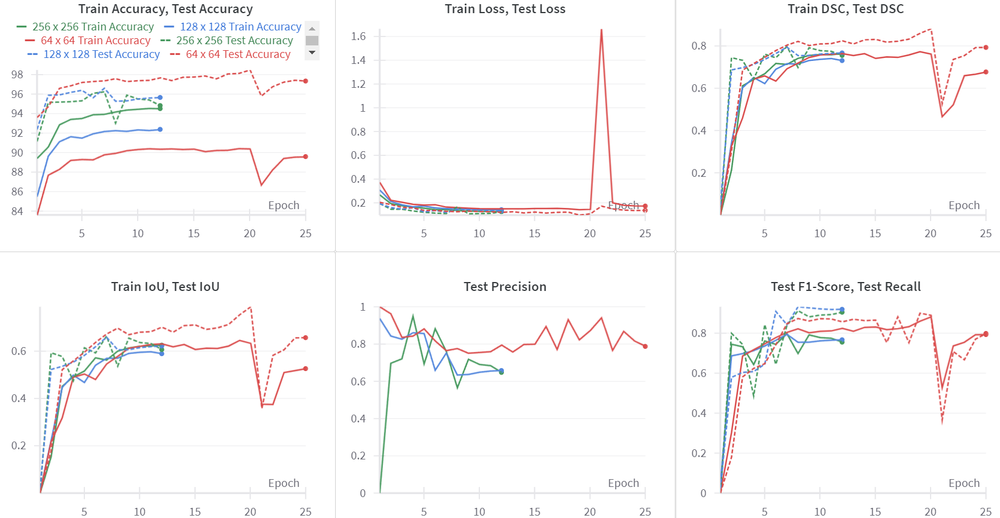



---


##  ▶ **Compare Original Image and Ground Truth Mask with Predicted Mask**

---



▶  **Function to display original, ground truth, and predicted masks with their IoUs (Intersection over Union) with 20 samples**



---


## 🌱 **64 x 64 resolution**

---



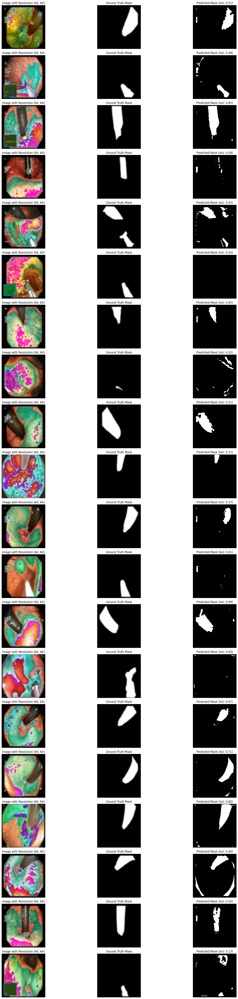

Image 1 IoU: 0.51
Image 2 IoU: 0.48
Image 3 IoU: 0.85
Image 4 IoU: 0.09
Image 5 IoU: 0.43
Image 6 IoU: 0.00
Image 7 IoU: 0.65
Image 8 IoU: 0.02
Image 9 IoU: 0.51
Image 10 IoU: 0.31
Image 11 IoU: 0.37
Image 12 IoU: 0.01
Image 13 IoU: 0.69
Image 14 IoU: 0.00
Image 15 IoU: 0.47
Image 16 IoU: 0.71
Image 17 IoU: 0.80
Image 18 IoU: 0.46
Image 19 IoU: 0.50
Image 20 IoU: 0.13


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

target_resolution = (64, 64)
resize_transform = transforms.Resize(target_resolution)

# Function to apply the transformation
def resize_images(images, resolution):
    resized_images = []
    for img in images:
        img_pil = transforms.ToPILImage()(img)
        resized_img = resize_transform(img_pil)
        resized_img_tensor = transforms.ToTensor()(resized_img)
        resized_images.append(resized_img_tensor)
    return torch.stack(resized_images)

# Function to display predictions
def display_predictions(images, true_masks, predicted_masks, ious, num_images=20):
    plt.figure(figsize=(20, num_images * 3))

    for i in range(num_images):
        # Resized Image with Target Resolution
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(images[i].cpu().numpy().transpose(1, 2, 0))  # From (C, H, W) to (H, W, C)
        plt.title(f"Image with Resolution {target_resolution}")
        plt.axis('off')

        # Ground Truth Mask
        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(true_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

        # Predicted Mask
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(predicted_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title(f"Predicted Mask (IoU: {ious[i]:.2f})")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to calculate IoU for each image
def calculate_iou_per_image(true_masks, predicted_masks, threshold=0.5):
    ious = []
    batch_size = true_masks.size(0)

    for i in range(batch_size):
        pred_mask = (predicted_masks[i] > threshold).float()
        true_mask = true_masks[i].float()

        # Calculate Intersection and Union
        intersection = (pred_mask * true_mask).sum()
        union = pred_mask.sum() + true_mask.sum() - intersection

        if union == 0:
            iou = 0.0
        else:
            iou = intersection / union  # IoU formula

        ious.append(iou.item())

    return ious

# Collect images from multiple batches
collected_images = []
collected_masks = []
collected_pred_masks = []
collected_ious = []

num_images_needed = 20
collected_so_far = 0

for images, masks in test_loader:
    images, masks = images.to(device), masks.to(device)

    model.eval()
    with torch.no_grad():
        predicted_masks = model(images)
        predicted_masks = (predicted_masks > 0.6).float()

    ious = calculate_iou_per_image(masks, predicted_masks)

    collected_images.extend(images.cpu())
    collected_masks.extend(masks.cpu())
    collected_pred_masks.extend(predicted_masks.cpu())
    collected_ious.extend(ious)

    collected_so_far += len(images)

    if collected_so_far >= num_images_needed:
        break

collected_images = torch.stack(collected_images)[:num_images_needed]
collected_masks = torch.stack(collected_masks)[:num_images_needed]
collected_pred_masks = torch.stack(collected_pred_masks)[:num_images_needed]
collected_ious = collected_ious[:num_images_needed]

collected_images_resized = resize_images(collected_images, target_resolution)
display_predictions(collected_images_resized, collected_masks, collected_pred_masks, collected_ious, num_images=num_images_needed)

for idx, iou in enumerate(collected_ious):
    print(f"Image {idx + 1} IoU: {iou:.2f}")




---


## 🌱 **128 x 128 resolution**

---



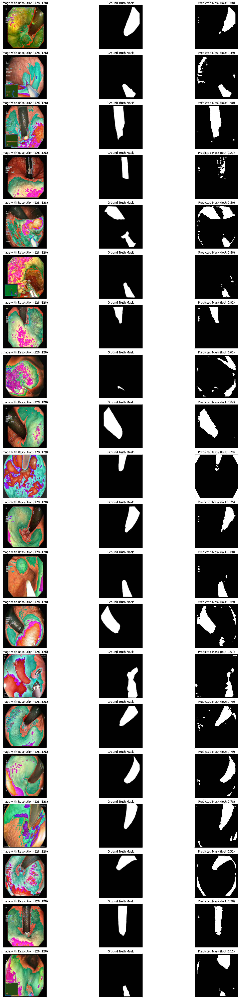

Image 1 IoU: 0.68
Image 2 IoU: 0.49
Image 3 IoU: 0.90
Image 4 IoU: 0.27
Image 5 IoU: 0.50
Image 6 IoU: 0.48
Image 7 IoU: 0.81
Image 8 IoU: 0.02
Image 9 IoU: 0.84
Image 10 IoU: 0.28
Image 11 IoU: 0.75
Image 12 IoU: 0.80
Image 13 IoU: 0.69
Image 14 IoU: 0.51
Image 15 IoU: 0.70
Image 16 IoU: 0.79
Image 17 IoU: 0.78
Image 18 IoU: 0.52
Image 19 IoU: 0.78
Image 20 IoU: 0.11


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

target_resolution = (128, 128)
resize_transform = transforms.Resize(target_resolution)

# Function to apply the transformation
def resize_images(images, resolution):
    resized_images = []
    for img in images:
        img_pil = transforms.ToPILImage()(img)
        resized_img = resize_transform(img_pil)
        resized_img_tensor = transforms.ToTensor()(resized_img)
        resized_images.append(resized_img_tensor)
    return torch.stack(resized_images)

# Function to display predictions
def display_predictions(images, true_masks, predicted_masks, ious, num_images=20):
    plt.figure(figsize=(20, num_images * 3))

    for i in range(num_images):
        # Resized Image with Target Resolution
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(images[i].cpu().numpy().transpose(1, 2, 0))  # From (C, H, W) to (H, W, C)
        plt.title(f"Image with Resolution {target_resolution}")
        plt.axis('off')

        # Ground Truth Mask
        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(true_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

        # Predicted Mask
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(predicted_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title(f"Predicted Mask (IoU: {ious[i]:.2f})")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to calculate IoU for each image
def calculate_iou_per_image(true_masks, predicted_masks, threshold=0.5):
    ious = []
    batch_size = true_masks.size(0)

    for i in range(batch_size):
        pred_mask = (predicted_masks[i] > threshold).float()
        true_mask = true_masks[i].float()

        # Calculate Intersection and Union
        intersection = (pred_mask * true_mask).sum()
        union = pred_mask.sum() + true_mask.sum() - intersection

        if union == 0:
            iou = 0.0
        else:
            iou = intersection / union  # IoU formula

        ious.append(iou.item())

    return ious

# Collect images from multiple batches
collected_images = []
collected_masks = []
collected_pred_masks = []
collected_ious = []

num_images_needed = 20
collected_so_far = 0

# Iterate over the test_loader to collect images until we have enough
for images, masks in test_loader:
    images, masks = images.to(device), masks.to(device)

    # Set model to evaluation mode and predict masks
    model.eval()
    with torch.no_grad():
        predicted_masks = model(images)
        predicted_masks = (predicted_masks > 0.6).float()

    ious = calculate_iou_per_image(masks, predicted_masks)

    collected_images.extend(images.cpu())
    collected_masks.extend(masks.cpu())
    collected_pred_masks.extend(predicted_masks.cpu())
    collected_ious.extend(ious)

    collected_so_far += len(images)

    if collected_so_far >= num_images_needed:
        break

collected_images = torch.stack(collected_images)[:num_images_needed]
collected_masks = torch.stack(collected_masks)[:num_images_needed]
collected_pred_masks = torch.stack(collected_pred_masks)[:num_images_needed]
collected_ious = collected_ious[:num_images_needed]
collected_images_resized = resize_images(collected_images, target_resolution)
display_predictions(collected_images_resized, collected_masks, collected_pred_masks, collected_ious, num_images=num_images_needed)

for idx, iou in enumerate(collected_ious):
    print(f"Image {idx + 1} IoU: {iou:.2f}")




---


## 🌱 **256 x 256 resolution**

---



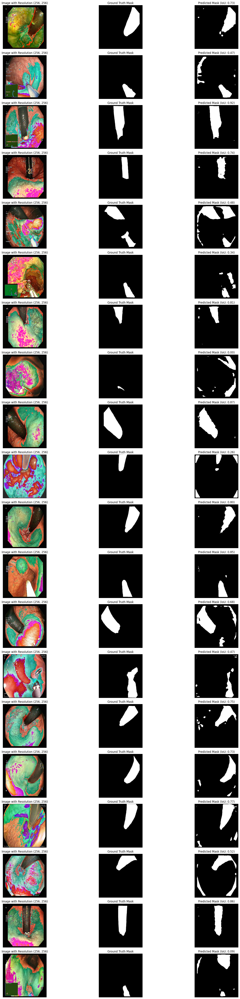

Image 1 IoU: 0.73
Image 2 IoU: 0.47
Image 3 IoU: 0.92
Image 4 IoU: 0.74
Image 5 IoU: 0.48
Image 6 IoU: 0.34
Image 7 IoU: 0.81
Image 8 IoU: 0.00
Image 9 IoU: 0.87
Image 10 IoU: 0.26
Image 11 IoU: 0.80
Image 12 IoU: 0.85
Image 13 IoU: 0.68
Image 14 IoU: 0.47
Image 15 IoU: 0.75
Image 16 IoU: 0.73
Image 17 IoU: 0.77
Image 18 IoU: 0.52
Image 19 IoU: 0.86
Image 20 IoU: 0.09


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

target_resolution = (256, 256)
resize_transform = transforms.Resize(target_resolution)

# Function to apply the transformation
def resize_images(images, resolution):
    resized_images = []
    for img in images:
        img_pil = transforms.ToPILImage()(img)
        resized_img = resize_transform(img_pil)
        resized_img_tensor = transforms.ToTensor()(resized_img)
        resized_images.append(resized_img_tensor)
    return torch.stack(resized_images)

# Function to display predictions
def display_predictions(images, true_masks, predicted_masks, ious, num_images=20):
    plt.figure(figsize=(20, num_images * 3))

    for i in range(num_images):
        # Resized Image with Target Resolution
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(images[i].cpu().numpy().transpose(1, 2, 0))  # From (C, H, W) to (H, W, C)
        plt.title(f"Image with Resolution {target_resolution}")
        plt.axis('off')

        # Ground Truth Mask
        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(true_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

        # Predicted Mask
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(predicted_masks[i].cpu().numpy().squeeze(), cmap='gray')
        plt.title(f"Predicted Mask (IoU: {ious[i]:.2f})")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to calculate IoU for each image
def calculate_iou_per_image(true_masks, predicted_masks, threshold=0.5):
    ious = []
    batch_size = true_masks.size(0)

    for i in range(batch_size):
        pred_mask = (predicted_masks[i] > threshold).float()
        true_mask = true_masks[i].float()

        # Calculate Intersection and Union
        intersection = (pred_mask * true_mask).sum()
        union = pred_mask.sum() + true_mask.sum() - intersection

        if union == 0:
            iou = 0.0
        else:
            iou = intersection / union  # IoU formula

        ious.append(iou.item())

    return ious

# Collect images from multiple batches
collected_images = []
collected_masks = []
collected_pred_masks = []
collected_ious = []

num_images_needed = 20
collected_so_far = 0

# Iterate over the test_loader to collect images until we have enough
for images, masks in test_loader:
    images, masks = images.to(device), masks.to(device)

    model.eval()
    with torch.no_grad():
        predicted_masks = model(images)
        predicted_masks = (predicted_masks > 0.6).float()

    ious = calculate_iou_per_image(masks, predicted_masks)
    collected_images.extend(images.cpu())
    collected_masks.extend(masks.cpu())
    collected_pred_masks.extend(predicted_masks.cpu())
    collected_ious.extend(ious)

    collected_so_far += len(images)

    if collected_so_far >= num_images_needed:
        break

collected_images = torch.stack(collected_images)[:num_images_needed]
collected_masks = torch.stack(collected_masks)[:num_images_needed]
collected_pred_masks = torch.stack(collected_pred_masks)[:num_images_needed]
collected_ious = collected_ious[:num_images_needed]

collected_images_resized = resize_images(collected_images, target_resolution)
display_predictions(collected_images_resized, collected_masks, collected_pred_masks, collected_ious, num_images=num_images_needed)

for idx, iou in enumerate(collected_ious):
    print(f"Image {idx + 1} IoU: {iou:.2f}")
